In [1]:
import contextily as ctx
import geopandas as gpd
import pandas as pd
import libpysal as lps
import pysal as ps
import palettable as pltt
import numpy as np

import datashader as ds
import datashader.transfer_functions as tf
import matplotlib.pyplot as plt

from datashader.bundling import connect_edges, hammer_bundle
from datashader.colors import inferno, viridis
from datashader.utils import export_image

from colorcet import palette
from matplotlib import cm

/Users/andrewrenninger/anaconda3/envs/sandbox/lib/python3.8/site-packages/pysal/explore/segregation/network/network.py:15: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  warn(
/Users/andrewrenninger/anaconda3/envs/sandbox/lib/python3.8/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


In [2]:
edges = pd.read_csv("gg_edges.csv")
edges = edges[edges['month']==1].drop('month', axis=1)

edges.head()

,focal,target,weight
17,10150014004,421010002001,4
22,10199560003,421010134023,4
31,10310112013,421019800001,4
42,10499604002,421010010021,4
47,10539701003,421019809001,4


In [3]:
nodes = pd.read_csv("gg_nodes.csv")
nodes = nodes.set_index('cbg')

nodes.head()

,X,Y
cbg,,
421010274025,2.703558e+06,269917.929361
421010279021,2.695731e+06,268673.608611
421010315022,2.723628e+06,269489.602884
421010029001,2.692812e+06,227288.850551
421010330007,2.728623e+06,267193.128419


In [5]:
pd.read_csv("gg_nodes.csv").dtypes

cbg      int64
X      float64
Y      float64
dtype: object

In [4]:
%%time
g1 = connect_edges(nodes, edges,
                   source='focal', target='target',
                   x='X', y='Y')

CPU times: user 617 ms, sys: 26.5 ms, total: 644 ms
Wall time: 642 ms


In [5]:
palette["viridis"]=viridis
palette["inferno"]=inferno

In [6]:
%%time
g2 = hammer_bundle(nodes, edges,
                   source='focal', target='target',
                   decay=0.25,
                   initial_bandwidth=0.1,
                   x='X', y='Y')

CPU times: user 1min 13s, sys: 1min 3s, total: 2min 17s
Wall time: 1min 26s


Unbundled,Bundled

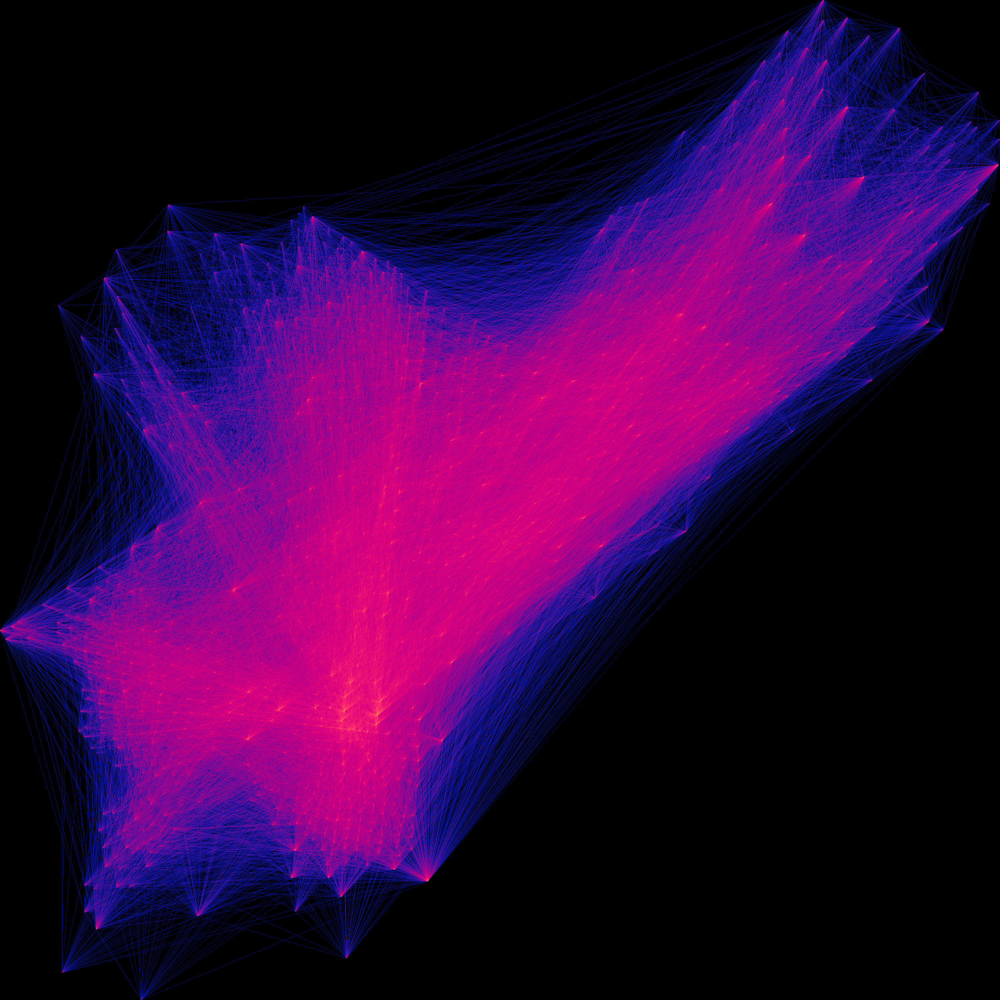
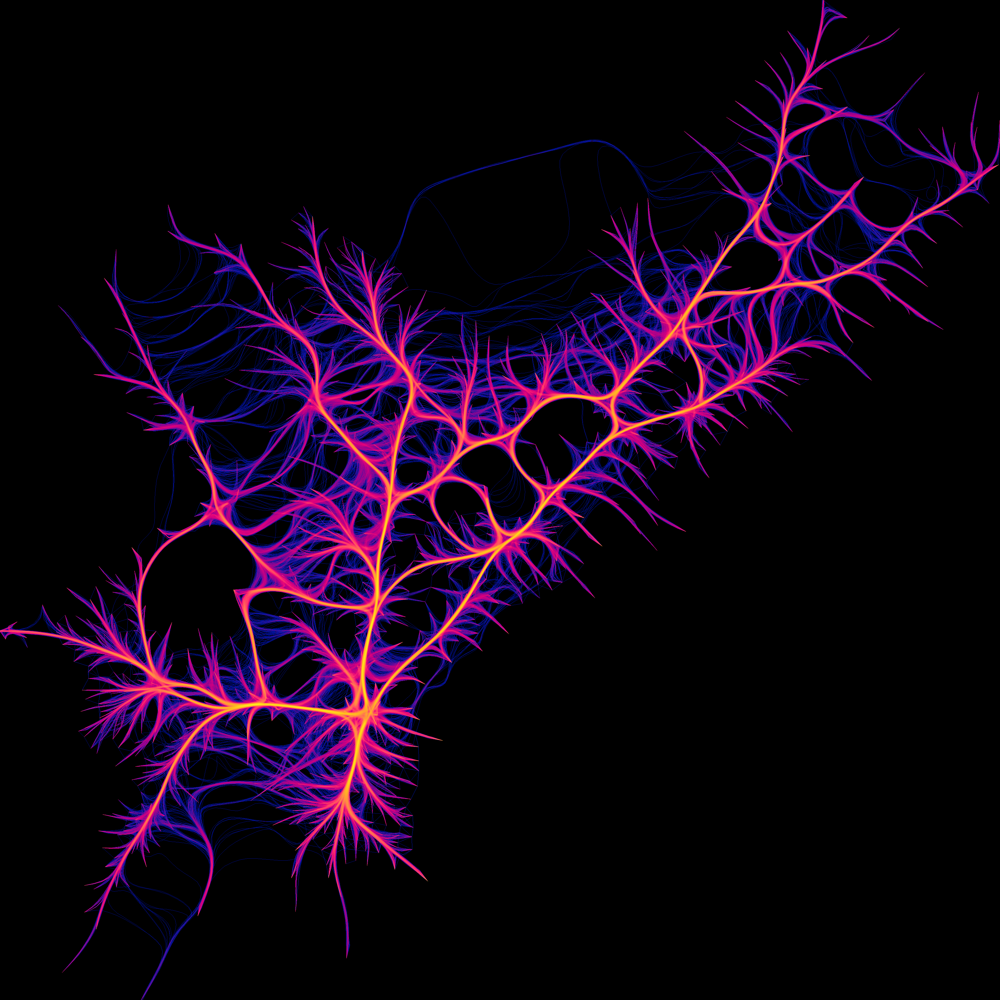

In [7]:
canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                   y_range=(nodes['Y'].min(), nodes['Y'].max()),
                   plot_height=3000, plot_width=3000)


p1 = tf.shade(canvas.line(g1, 'X', 'Y', agg=ds.count()),  cmap=palette['bmy'], how='log', name="Unbundled")

canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                   y_range=(nodes['Y'].min(), nodes['Y'].max()),
                   plot_height=3000, plot_width=3000)

p2 = tf.shade(canvas.line(g2, 'X','Y', agg=ds.count()), cmap=palette['bmy'], how='log', name="Bundled")

tf.Images(tf.set_background(p1, "#000000"), tf.set_background(p2, "#000000")).cols(2)

In [8]:
pal = pd.read_csv("https://raw.githubusercontent.com/asrenninger/philamonitor/master/miscellany/pal.txt", 
                  header=None, squeeze=True).tolist()

In [9]:
edges = pd.read_csv("gg_edges.csv")

In [10]:
abridged = edges[edges['weight']>10]

In [11]:
def nodesplot(nodes):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.points(nodes,'X','Y',agg=None)
    spr = tf.spread(tf.shade(agg, cmap=palette['CET_L7'][20]), px=5)
    
    return spr

def edgesplot(edges):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.line(edges, 'X','Y', agg=ds.count())
    spr = tf.shade(agg, cmap=palette['CET_L7'][20:], how='log')
    
    return spr

def combiplot(nodes, edges):
    
    verts = nodesplot(nodes)
    links = edgesplot(edges)
    
    stack = tf.stack(verts, links)
    
    return tf.set_background(stack, '#000000')

In [12]:
graph_list = list()

for mon in np.sort(abridged.month.unique()):
    print(mon)
    
    temp = abridged[abridged['month']==mon].drop('month', axis=1)
    
    g = hammer_bundle(nodes, temp,
                      source='focal', target='target',
                      decay=0.25,
                      x='X', y='Y', weight='weight')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [13]:
for i in np.arange(0, 8):
    
    temp = combiplot(nodes, graph_list[i])
    
    export_image(temp, f"{i+1}")

In [14]:
graph_list = list()

for mon in np.sort(abridged.month.unique()):
    print(mon)
    
    temp = abridged[abridged['month']==mon].drop('month', axis=1)
    
    g = connect_edges(nodes, temp,
                      source='focal', target='target',
                      x='X', y='Y')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [15]:
for i in np.arange(0, 8):
    
    temp = combiplot(nodes, graph_list[i])
    
    export_image(temp, f"{i+1}")

In [16]:
months = ["January", "February", "March", "April", "May", "June", "July", "August"]

In [17]:
shape = gpd.read_file("http://data.phl.opendata.arcgis.com/datasets/2f982bada233478ea0100528227febce_0.geojson").to_crs(epsg=3857)
nodes = gpd.GeoDataFrame({'cbg': shape.GEOID10.astype('int64'),
                          'X': shape.centroid.x,'Y': shape.centroid.y}).set_index('cbg')

In [18]:
pal = pd.read_csv("https://raw.githubusercontent.com/asrenninger/palettes/master/turbo.txt", 
                  header=None, squeeze=True).tolist()

In [19]:
def nodesplot(nodes):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.points(nodes,'X','Y',agg=None)
    spr = tf.spread(tf.shade(agg, cmap=palette['CET_L7'][20]), px=8)
    
    return spr

def edgesplot(nodes, edges):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.line(edges, 'X','Y', agg=ds.count())
    spr = tf.shade(agg, cmap=palette['CET_L7'][20:], how='log')
    
    return spr

def combiplot(nodes, edges):
    
    verts = nodesplot(nodes)
    links = edgesplot(nodes, edges)
    
    stack = tf.stack(verts, links)
    
    ready = tf.set_background(stack, '#000000')
    
    return ready.to_pil()

def plot_graphs_by_month(fig, data, nodes, month, x_range, y_range):
    
    temp = data[data['month']==month].drop('month', axis=1)
    
    graph = hammer_bundle(nodes, temp,
                          source='focal', target='target',
                          decay=0.25,
                          x='X', y='Y', weight='weight')

    img = combiplot(nodes, graph)

    plt.clf()
    ax = fig.gca()
    ax.imshow(img, extent=[x_range[0], x_range[1], y_range[0], y_range[1]], origin='upper')
    ax.set_axis_off()
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig.tight_layout()

    ax.text(
        0.05,
        0.9,
        "Origin-Destination Flows",
        color="white",
        weight='bold',
        fontsize=40,
        ha="left",
        transform=ax.transAxes,
    )
    
    ax.text(
        0.05,
        0.85,
        months[month-1],
        color="white",
        fontsize=40,
        ha="left",
        transform=ax.transAxes,
    )
    
    shape.plot(color='None', edgecolor='#ffffff', linewidth=0.25, alpha=0.5, ax=ax)

    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

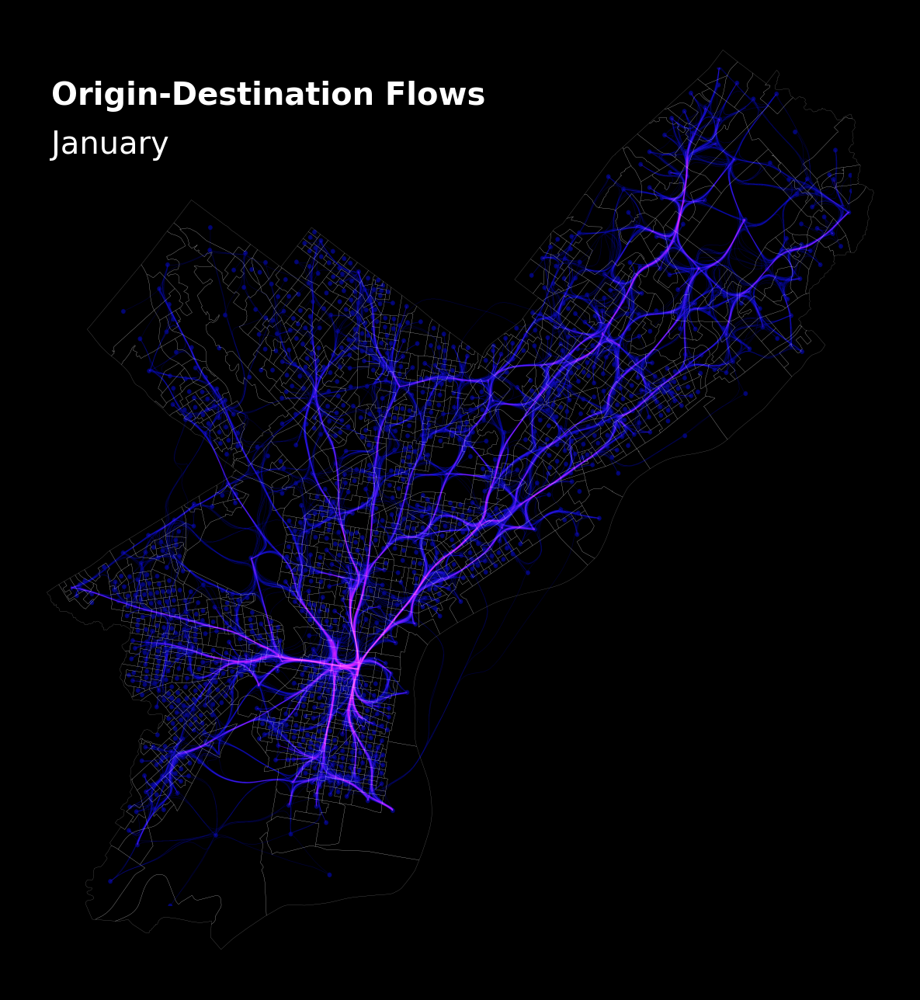

In [20]:
philly = [(nodes['X'].min(), nodes['X'].max()), (nodes['Y'].min(), nodes['Y'].max())]

fig, ax = plt.subplots(figsize=(18, 18), facecolor='black')

img = plot_graphs_by_month(fig, abridged, nodes, 1, x_range=philly[0], y_range=philly[1])

In [21]:
import imageio

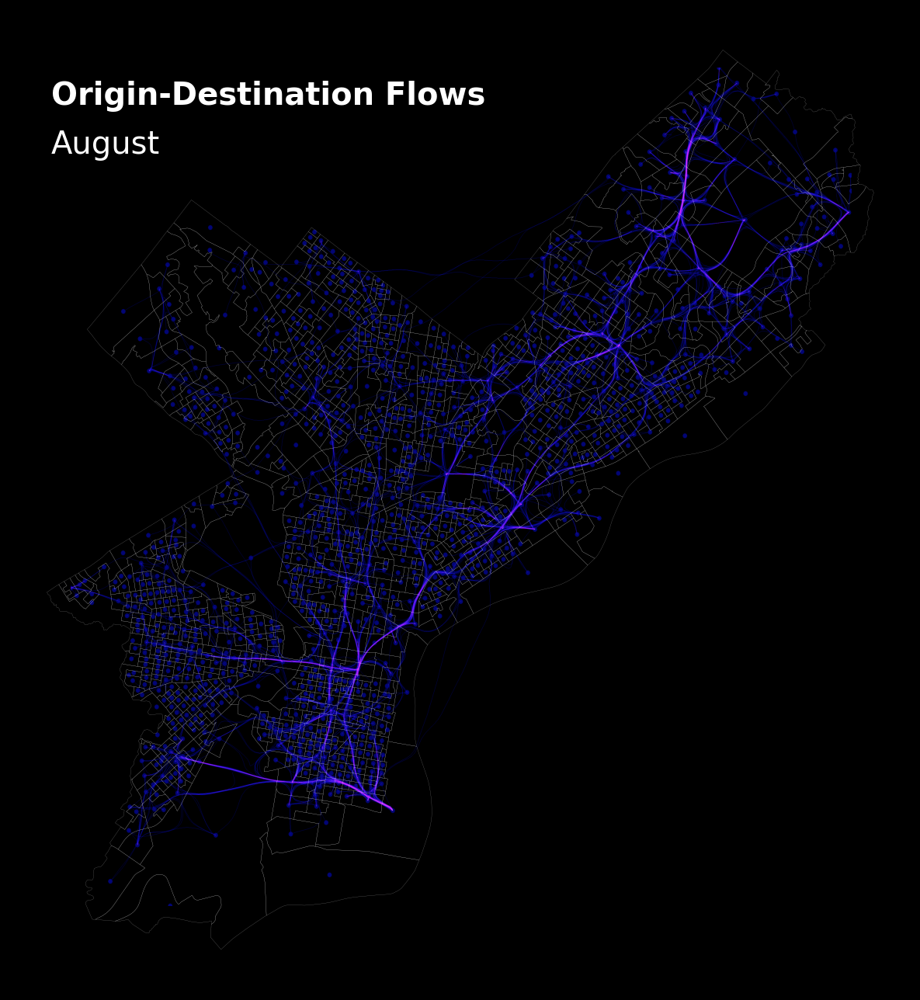

In [22]:
fig, ax = plt.subplots(figsize=(18, 18), facecolor='black')

imgs = []

for period in np.sort(abridged.month.unique()):
    
    img = plot_graphs_by_month(fig, abridged, nodes, period, x_range=philly[0], y_range=philly[1])
    imgs.append(img)
    
imageio.mimsave('connections.gif', imgs, fps=1);

In [248]:
daily = pd.read_csv("moves_daily.csv")

daily['date'] = "2020" + "-" + daily['month'].astype('str') + "-" + daily['day'].astype('str')
daily['date'] = pd.DatetimeIndex(pd.to_datetime(daily['date'], format='%Y-%m-%d'))
daily['name'] = daily['date'].dt.day_name()

In [288]:
def create_image(df, x_range, y_range):
    
    cvs = ds.Canvas(plot_width=3000, plot_height=3000, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'X', 'Y',  ds.sum('visits'))
    img = tf.spread(tf.shade(agg, cmap=palette['CET_L7'][20:], how='eq_hist'), px=2, how='add')
    img = tf.set_background(img, "#000000")
    
    return img.to_pil()

def plot_activity_by_day(fig, data_all_days, month, day, x_range, y_range):

    df_this_day = data_all_days.loc[(data_all_days['day']==day) & (data_all_days['month']==month)]
    df_this_day = df_this_day[df_this_day['visits']!=0]

    img = create_image(df_this_day, x_range, y_range)

    plt.clf()
    ax = fig.gca()
    ax.imshow(img, extent=[x_range[0], x_range[1], y_range[0], y_range[1]])
    ax.set_axis_off()
    
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig.tight_layout()

    ax.text(
        0.85,
        0.4,
        "Visits",
        color="white",
        weight='bold',
        fontsize=30,
        ha="right",
        transform=ax.transAxes,
    )
    
    lab = df_this_day['name'].unique()[0]
    
    ax.text(
        0.85,
        0.25,
        f"{lab}\n{months[month-1]}\n{day}",
        color="white",
        fontsize=30,
        ha="right",
        transform=ax.transAxes,
    )
    
    shape.plot(color='None', edgecolor='#ffffff', linewidth=0.25, alpha=0.4, ax=ax)

    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

In [289]:
from datashader.utils import lnglat_to_meters

X, Y = lnglat_to_meters(daily['longitude'], daily['latitude'])

daily['X'] = X
daily['Y'] = Y

In [290]:
import imageio

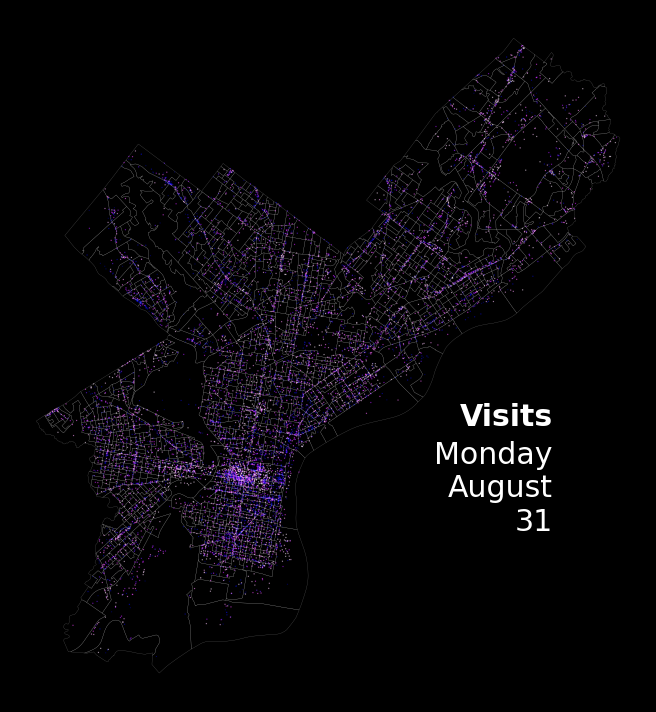

In [291]:
philly = [(hourly['X'].min(), hourly['X'].max()), (hourly['Y'].min(), hourly['Y'].max())]
months = ["January", "February", "March", "April", "May", "June", "July", "August"]

fig, ax = plt.subplots(figsize=(10,10), facecolor='black')

imgs = []

for period in np.sort(daily.month.unique()):
    for day in np.sort(daily[daily['month']==period].day.unique()):
        
        img = plot_activity_by_day(fig, daily, period, day, x_range=philly[0], y_range=philly[1])
        imgs.append(img)
    
imageio.mimsave('activity.gif', imgs, fps=2);